# Extract speaker embeddings

In [1]:
"""
You can either run this notebook locally (if you have all the dependencies and a GPU) or on Google Colab.
Instructions for setting up Colab are as follows:
1. Open a new Python 3 notebook.
2. Import this notebook from GitHub (File -> Upload Notebook -> "GITHUB" tab -> copy/paste GitHub URL)
3. Connect to an instance with a GPU (Runtime -> Change runtime type -> select "GPU" for hardware accelerator)
4. Run this cell to set up dependencies.
"""
BRANCH = 'main'
# # If you're using Google Colab and not running locally, uncomment and run this cell.
# !apt-get install sox libsndfile1 ffmpeg
# !pip install wget unidecode pynini==2.1.4
# !python -m pip install git+https://github.com/NVIDIA/NeMo.git@$BRANCH#egg=nemo_toolkit[all]

In [2]:
home_path = !(echo $HOME)
home_path = home_path[0]
print(home_path)

/root


In [33]:
import os
import json

import torch
import IPython.display as ipd
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt

import nemo
from nemo.collections.tts.models import FastPitchModel
from nemo.collections.asr.parts.utils.speaker_utils import embedding_normalize
import nemo.collections.asr as nemo_asr
from omegaconf import OmegaConf

from pathlib import Path

In [4]:
nemo_asr.models.EncDecSpeakerLabelModel.list_available_models()

[PretrainedModelInfo(
 	pretrained_model_name=speakerverification_speakernet,
 	description=For details about this model, please visit https://ngc.nvidia.com/catalog/models/nvidia:nemo:speakerverification_speakernet,
 	location=https://api.ngc.nvidia.com/v2/models/nvidia/nemo/speakerverification_speakernet/versions/1.0.0rc1/files/speakerverification_speakernet.nemo
 ),
 PretrainedModelInfo(
 	pretrained_model_name=ecapa_tdnn,
 	description=For details about this model, please visit https://ngc.nvidia.com/catalog/models/nvidia:nemo:ecapa_tdnn,
 	location=https://api.ngc.nvidia.com/v2/models/nvidia/nemo/ecapa_tdnn/versions/v1/files/ecapa_tdnn.nemo
 ),
 PretrainedModelInfo(
 	pretrained_model_name=titanet_large,
 	description=For details about this model, please visit https://catalog.ngc.nvidia.com/orgs/nvidia/teams/nemo/models/titanet_large,
 	location=https://api.ngc.nvidia.com/v2/models/nvidia/nemo/titanet_large/versions/v0/files/titanet-l.nemo
 )]

In [4]:
# FastPitchModel.from_pretrained("tts_en_fastpitch")
verification_model = nemo_asr.models.EncDecSpeakerLabelModel.from_pretrained('titanet_large')

[NeMo I 2022-05-12 04:29:01 cloud:66] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/titanet_large/versions/v0/files/titanet-l.nemo to /root/.cache/torch/NeMo/NeMo_1.9.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo
100% [........................................................................] 94823093 / 94823093[NeMo I 2022-05-12 04:29:05 common:789] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 04:29:06 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    manifest_filepath: /manifests/combined_fisher_swbd_voxceleb12_librispeech/train.json
    sample_rate: 16000
    labels: null
    batch_size: 64
    shuffle: true
    time_length: 3
    is_tarred: false
    tarred_audio_filepaths: null
    tarred_shard_strategy: scatter
    augmentor:
      noise:
        manifest_path: /manifests/noise/rir_noise_manifest.json
        prob: 0.5
        min_snr_db: 0
        max_snr_db: 15
      speed:
        prob: 0.5
        sr: 16000
        resample_type: kaiser_fast
        min_speed_rate: 0.95
        max_speed_rate: 1.05
    num_workers: 15
    pin_memory: true
    
[NeMo W 2022-05-12 04:29:06 modelPT:155] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_valida

[NeMo I 2022-05-12 04:29:06 features:200] PADDING: 16
[NeMo I 2022-05-12 04:29:06 label_models:100] loss is Angular Softmax
[NeMo I 2022-05-12 04:29:07 save_restore_connector:243] Model EncDecSpeakerLabelModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/titanet-l/492c0ab8416139171dc18c21879a9e45/titanet-l.nemo.


In [5]:
import json
def json_reader(filename):
    with open(filename) as f:
        for line in f:
            yield json.loads(line)
            
            
def json_writer(file, json_objects):
    with open(file, "w") as f:
        for jsonobj in json_objects:
            jsonstr = json.dumps(jsonobj)
            f.write(jsonstr + "\n")

In [50]:
# unseen by Titanet, seen by Embedding lookup
hifitts = list(json_reader('/data/speech/HiFiTTS/hi_fi_tts_v0/manifest_test.json'))
# seen by Titanet, seen by Embedding lookup
libritts = list(json_reader('/data/speech/LibriTTS2/LibriTTS/train_clean_100_normalized.json'))

# Generate speaker embeddings from Titanet

To generate speaker embeddings we will use 3 speech utterances for each speaker

In [11]:
speakers_utterance = {}
for h in hifitts:
    if h['speaker'] not in speakers_utterance:
        speakers_utterance[h['speaker']] = []
    elif len(speakers_utterance[h['speaker']]) < 3:
        speakers_utterance[h['speaker']].append(h)

In [8]:
import json
import numpy as np
import torch
import soundfile as sf
import librosa
import time
import pickle as pkl

from pathlib import Path

In [9]:
def load_wav(audio_file, target_sr=None):
        with sf.SoundFile(audio_file, 'r') as f:
            samples = f.read(dtype='float32')
            sample_rate = f.samplerate
        if target_sr is not None and sample_rate != target_sr:
            samples = librosa.core.resample(samples, orig_sr=sample_rate, target_sr=target_sr)
        return samples.transpose()

def get_embeddings(speaker_model, speakers_utterance, embedding_dir='./', device='cuda'):

    speaker_model = speaker_model.to(device)
    speaker_model.eval()
    
    out_embeddings = {}
    speaker_embeddings = {}
           
    for speaker, utter in speakers_utterance.items():
        for elem in utter:
            audio = load_wav(elem["audio_filepath"], 22050)
            audio = torch.from_numpy(audio).unsqueeze(0).to(device)
            audio_len = torch.tensor(audio.shape[1], dtype=torch.long, device=device).unsqueeze(0)
            
            _, embs = speaker_model.forward(input_signal=audio, input_signal_length=audio_len)
            emb_shape = embs.shape[-1]
            embs = embs.view(-1, emb_shape)
            if speaker not in speaker_embeddings:
                speaker_embeddings[speaker] = []
            speaker_embeddings[speaker].append(embs.cpu().detach().numpy())
            
    for k, v in speaker_embeddings.items():
        all_embs = np.asarray(v)
        all_embs = embedding_normalize(all_embs)
        all_embs = all_embs.mean(axis=0)
        out_embeddings[k] = all_embs

    embeddings_file = os.path.join(embedding_dir, 'manifest_test_titanet_speaker_embeddings_l2_norm.pkl')
    pkl.dump(out_embeddings, open(embeddings_file, 'wb'))
    print("Saved embedding files to {}".format(embedding_dir))

In [48]:
get_embeddings(verification_model, speakers_utterance, embedding_dir='/data/speech/HiFiTTS/hi_fi_tts_v0/', device='cuda')

Saved embedding files to /data/speech/HiFiTTS/hi_fi_tts_v0/


In [27]:
embedding_dir='/data/speech/HiFiTTS/hi_fi_tts_v0/'
embeddings_file = os.path.join(embedding_dir, 'manifest_test_titanet_speaker_embeddings_l2_norm.pkl')
hifitts_speaker_embeddings = pkl.load(open(embeddings_file, 'rb'))

In [62]:
embeddings_file = "/data/speech/LibriTTS2/LibriTTS/train_clean_100_titanet_speaker_embeddings_l2_normalized_mean.pkl"
libritts_speaker_embeddings = pkl.load(open(embeddings_file, 'rb'))

# Generate audio using speaker embeddings from Titanet

Load Fastpitch Model that takes Titanet speaker embeddings as inputs

In [34]:
# 22.1KHz
ckpt_file = '/data/speech/LibriTTS2/fastpitch_log_dir/FastPitch/2022-03-09_03-26-53/checkpoints/FastPitch--v_loss=1.2835-epoch=19.ckpt'
spec_gen_titanet = FastPitchModel.load_from_checkpoint(ckpt_file, strict=False)
spec_gen_titanet.eval().cuda();

[NeMo I 2022-05-12 05:06:33 tokenize_and_classify:92] Creating ClassifyFst grammars.


[NeMo W 2022-05-12 05:06:58 g2ps:84] apply_to_oov_word=None, it means that some of words will remain unchanged if they are not handled by one of rule in self.parse_one_word(). It is useful when you use tokenizer with set of phonemes and chars together, otherwise it can be not.
[NeMo W 2022-05-12 05:06:58 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.torch.data.TTSDataset
      manifest_filepath: /data/speech/LibriTTS2/LibriTTS/train_clean_100.json
      sample_rate: 22050
      sup_data_path: /data/speech/LibriTTS2/sup_data_path
      sup_data_types:
      - align_prior_matrix
      - pitch
      - speaker_id
      n_fft: 1024
      win_length: 1024
      hop_length: 256
      window: hann
      n_mels: 80
      lowfreq: 0
      highfreq: 8000
      max_duration: 15
      min_duratio

[NeMo I 2022-05-12 05:06:58 features:200] PADDING: 1


Load Fastpitch Model that trains an embedding lookup table on HiFiTTS

In [40]:
ckpt_file = '/data/speech/HiFiTTS/fastpitch_log_dir/FastPitch/2022-05-04_05-29-51/checkpoints/FastPitch--v_loss=0.8040-epoch=25.ckpt'
spec_gen_emb_lookup = FastPitchModel.load_from_checkpoint(ckpt_file, strict=False)
spec_gen_emb_lookup.eval().cuda();

[NeMo I 2022-05-12 05:13:18 tokenize_and_classify:92] Creating ClassifyFst grammars.


[NeMo W 2022-05-12 05:13:38 g2ps:84] apply_to_oov_word=None, it means that some of words will remain unchanged if they are not handled by one of rule in self.parse_one_word(). It is useful when you use tokenizer with set of phonemes and chars together, otherwise it can be not.
[NeMo W 2022-05-12 05:13:38 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.torch.data.TTSDataset
      manifest_filepath: /data/speech/HiFiTTS/hi_fi_tts_v0/manifest_train.json
      sample_rate: 22050
      sup_data_path: /data/speech/HiFiTTS/sup_data_path
      sup_data_types:
      - align_prior_matrix
      - pitch
      - speaker_id
      n_fft: 1024
      win_length: 1024
      hop_length: 256
      window: hann
      n_mels: 80
      lowfreq: 0
      highfreq: 8000
      max_duration: 20
      min_duration

[NeMo I 2022-05-12 05:13:38 features:200] PADDING: 1


Load vocoder

In [29]:
from nemo.collections.tts.models import HifiGanModel

vocoder = HifiGanModel.from_pretrained("tts_hifigan")
vocoder = vocoder.eval().cuda()

[NeMo I 2022-05-12 05:01:55 cloud:56] Found existing object /root/.cache/torch/NeMo/NeMo_1.9.0rc0/tts_hifigan/e6da322f0f7e7dcf3f1900a9229a7e69/tts_hifigan.nemo.
[NeMo I 2022-05-12 05:01:55 cloud:62] Re-using file from: /root/.cache/torch/NeMo/NeMo_1.9.0rc0/tts_hifigan/e6da322f0f7e7dcf3f1900a9229a7e69/tts_hifigan.nemo
[NeMo I 2022-05-12 05:01:55 common:789] Instantiating model from pre-trained checkpoint


[NeMo W 2022-05-12 05:01:57 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.MelAudioDataset
      manifest_filepath: /home/fkreuk/data/train_finetune.txt
      min_duration: 0.75
      n_segments: 8192
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 64
      num_workers: 4
    
[NeMo W 2022-05-12 05:01:57 modelPT:155] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.MelAudioDataset
      manifest_filepath: /home/fkreuk/data/val_finetune.txt
      min_duration: 3
      n_segments: 66150


[NeMo I 2022-05-12 05:01:57 features:200] PADDING: 0


[NeMo W 2022-05-12 05:01:57 features:177] Using torch_stft is deprecated and has been removed. The values have been forcibly set to False for FilterbankFeatures and AudioToMelSpectrogramPreprocessor. Please set exact_pad to True as needed.


[NeMo I 2022-05-12 05:01:57 features:200] PADDING: 0
[NeMo I 2022-05-12 05:01:58 save_restore_connector:243] Model HifiGanModel was successfully restored from /root/.cache/torch/NeMo/NeMo_1.9.0rc0/tts_hifigan/e6da322f0f7e7dcf3f1900a9229a7e69/tts_hifigan.nemo.


Method to generate ground truth spectrogram

In [19]:
from nemo.collections.tts.models.base import SpectrogramGenerator
from nemo.collections.asr.parts.preprocessing.segment import AudioSegment

import IPython.display as ipd
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt
%matplotlib inline

In [20]:
def get_mel_spect(
    n_fft = 1024,
    hop_len = 256,
    win_length = 1024,
    sample_rate = 22050,
    n_mels = 80,
    highfreq = 8000,
    lowfreq = 0,
    file_path = hifitts[10]['audio_filepath'],
    window = 'hann'
    ):

    audio = AudioSegment.from_file(
        file_path,
        target_sr=sample_rate,
        int_values=False,
        offset=0,
        duration=0,
        trim=False,
        orig_sr=None,
    )

    audio = torch.tensor(audio.samples, dtype=torch.float)

    window_fn = {
        'hann': torch.hann_window,
        'hamming': torch.hamming_window,
        'blackman': torch.blackman_window,
        'bartlett': torch.bartlett_window,
        'none': None,
    }.get(window, None)


    fb = torch.tensor(
        librosa.filters.mel(
            sr=sample_rate, n_fft=n_fft, n_mels=n_mels, fmin=lowfreq, fmax=highfreq
        ),
        dtype=torch.float,
    ).unsqueeze(0)

    stft = lambda x: torch.stft(
        input=x,
        n_fft=n_fft,
        hop_length=hop_len,
        win_length=win_length,
        window=window_fn(win_length, periodic=False).to(torch.float) if window_fn else None,
        return_complex=True,
    )

    spec = stft(audio)
    if spec.dtype in [torch.cfloat, torch.cdouble]:
        spec = torch.view_as_real(spec)
    spec = torch.sqrt(spec.pow(2).sum(-1) + 1e-9)
    mel = torch.matmul(fb.to(spec.dtype), spec)
    log_mel = torch.log(torch.clamp(mel, min=torch.finfo(mel.dtype).tiny))
    return log_mel.cpu().detach().numpy()[0,...]

In [81]:
import random
random.seed(41)
val_records = random.sample(hifitts, 10)
len(val_records)

10

Inference method

In [80]:
def infer(spec_gen_model, vocoder_model, str_input, speaker=None, speaker_emb=None):
    """
    Synthesizes spectrogram and audio from a text string given a spectrogram synthesis and vocoder model.
    
    Args:
        spec_gen_model: Spectrogram generator model (FastPitch in our case)
        vocoder_model: Vocoder model (HiFiGAN in our case)
        str_input: Text input for the synthesis
        speaker: Speaker ID
    
    Returns:
        spectrogram and waveform of the synthesized audio.
    """
    with torch.no_grad():
        parsed = spec_gen_model.parse(str_input)
        if speaker is not None:
            speaker = torch.tensor([speaker]).long().to(device=spec_gen_model.device)
            spectrogram = spec_gen_model.generate_spectrogram(tokens=parsed, speaker=speaker)
        elif speaker_emb is not None:
            speaker_emb = torch.tensor(speaker_emb).float().to(device=spec_gen_model.device)
            spectrogram = spec_gen_model.generate_spectrogram(tokens=parsed, speaker_emb=speaker_emb)
        audio = vocoder_model.convert_spectrogram_to_audio(spec=spectrogram)
        
    if spectrogram is not None:
        if isinstance(spectrogram, torch.Tensor):
            spectrogram = spectrogram.to('cpu').numpy()
        if len(spectrogram.shape) == 3:
            spectrogram = spectrogram[0]
    if isinstance(audio, torch.Tensor):
        audio = audio.to('cpu').numpy()
    return spectrogram, audio

### Inference on data seen by lookup table model but not by titanet embedding model

Real validation audio


SYNTHESIZED FOR -- Speaker: 8051 | Text: Knowledge and a highly-developed and highly-trained reason are to the temporal necessities of man what instinct is to the brute.
Lookup Audio


Titanet Audio


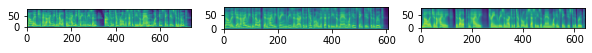

Real validation audio


SYNTHESIZED FOR -- Speaker: 8051 | Text: But do the scholars fail to understand the meaning of the words they read?
Lookup Audio


Titanet Audio


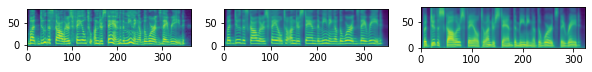

Real validation audio


SYNTHESIZED FOR -- Speaker: 12787 | Text: What shall be the first entry on the blank page of my wakening mind?
Lookup Audio


Titanet Audio


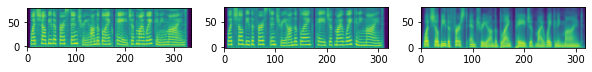

Real validation audio


SYNTHESIZED FOR -- Speaker: 9136 | Text: But now he's used to that sort of thing, isn't he?
Lookup Audio


Titanet Audio


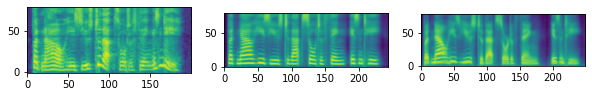

Real validation audio


SYNTHESIZED FOR -- Speaker: 9017 | Text: Oh, no!
Lookup Audio


Titanet Audio


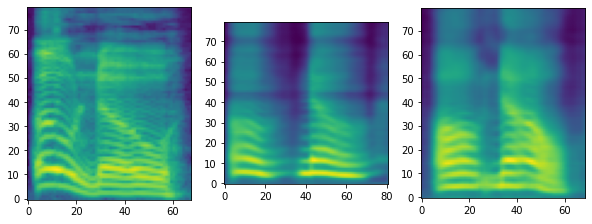

Real validation audio


SYNTHESIZED FOR -- Speaker: 9017 | Text: No!
Lookup Audio


Titanet Audio


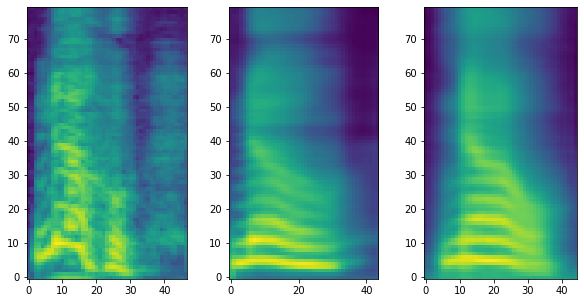

Real validation audio


SYNTHESIZED FOR -- Speaker: 8051 | Text: of Prussia,- one hundred million dollars;
Lookup Audio


Titanet Audio


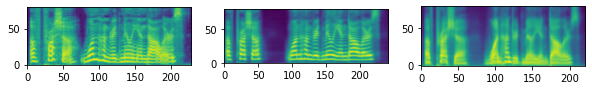

Real validation audio


SYNTHESIZED FOR -- Speaker: 11697 | Text: Quite true.
Lookup Audio


Titanet Audio


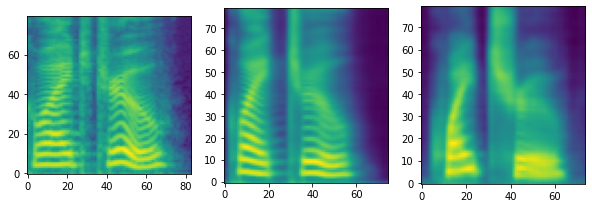

Real validation audio


SYNTHESIZED FOR -- Speaker: 9017 | Text: Unfortunately.
Lookup Audio


Titanet Audio


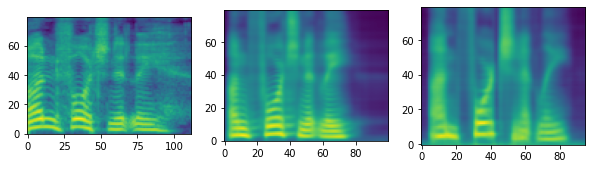

Real validation audio


SYNTHESIZED FOR -- Speaker: 11614 | Text: I heard them whisper to each other (and it seemed to me as if the woman were remonstrating with her mistress) while I installed the Princess on her cushions.
Lookup Audio


Titanet Audio


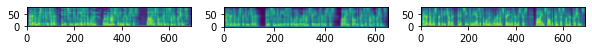

In [82]:
# Only need to set speaker_id if there is more than one speaker
speaker_id = None
plt.rcParams['figure.figsize'] = [10, 5]
            
for val_record in val_records:
    print("Real validation audio")
    ipd.display(ipd.Audio(val_record['audio_filepath'], rate=22050))
    #get GT mel spect
    original_spec = get_mel_spect(file_path=val_record['audio_filepath'])
    
    speaker_id = val_record['speaker']
    speaker_emb = hifitts_speaker_embeddings[val_record['speaker']]
    
    print(f"SYNTHESIZED FOR -- Speaker: {speaker_id} | Text: {val_record['normalized_text']}")
    spec_1, audio_1 = infer(spec_gen_emb_lookup, vocoder, val_record['normalized_text'], speaker=speaker_id)
    spec_2, audio_2 = infer(spec_gen_titanet, vocoder, val_record['normalized_text'], speaker_emb=speaker_emb)
    print("Lookup Audio")
    ipd.display(ipd.Audio(audio_1, rate=22050))
    print("Titanet Audio")
    ipd.display(ipd.Audio(audio_2, rate=22050))
    f, axarr = plt.subplots(1,3)
    axarr[0].imshow(original_spec, origin="lower")
    axarr[1].imshow(spec_1, origin="lower")
    axarr[2].imshow(spec_2, origin="lower")
#     imshow(spec, origin="lower", aspect="auto")
    plt.show()

### Inference on data seen by both lookup table model and by titanet embedding model

In [83]:
import random
random.seed(41)
val_records = random.sample(libritts, 10)
len(val_records)

10

In [84]:
ckpt_file = '/data/speech/LibriTTS2/fastpitch_log_dir/FastPitch/2022-03-02_19-11-23/checkpoints/FastPitch--v_loss=1.5918-epoch=9.ckpt'
spec_gen_emb_lookup_libritts = FastPitchModel.load_from_checkpoint(ckpt_file, strict=False)
spec_gen_emb_lookup_libritts.eval().cuda();

[NeMo I 2022-05-12 05:41:53 tokenize_and_classify:92] Creating ClassifyFst grammars.


[NeMo W 2022-05-12 05:42:18 g2ps:84] apply_to_oov_word=None, it means that some of words will remain unchanged if they are not handled by one of rule in self.parse_one_word(). It is useful when you use tokenizer with set of phonemes and chars together, otherwise it can be not.
[NeMo W 2022-05-12 05:42:18 modelPT:148] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.torch.data.TTSDataset
      manifest_filepath: /data/speech/LibriTTS2/LibriTTS/train_clean_100.json
      sample_rate: 22050
      sup_data_path: /data/speech/LibriTTS2/sup_data_path
      sup_data_types:
      - align_prior_matrix
      - pitch
      - speaker_id
      n_fft: 1024
      win_length: 1024
      hop_length: 256
      window: hann
      n_mels: 80
      lowfreq: 0
      highfreq: 8000
      max_duration: 15
      min_duratio

[NeMo I 2022-05-12 05:42:18 features:200] PADDING: 1


Real validation audio


SYNTHESIZED FOR -- Speaker: 7264 | Text: In pure Economics exchange is exactly balanced by the respective advantages of the exchangers; just as in pure dynamics you have the parallelogram of forces.
Lookup Audio


Titanet Audio


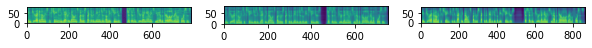

Real validation audio


SYNTHESIZED FOR -- Speaker: 6147 | Text: Lord David, on his side, bowed down before the fascinations of the Duchess Josiana-a maiden without spot or scruple, haughty, inaccessible, and audacious.
Lookup Audio


Titanet Audio


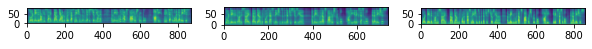

Real validation audio


SYNTHESIZED FOR -- Speaker: 311 | Text: It was my design to comprise in it all that, before I set myself to write it, I thought I knew of the nature of material objects.
Lookup Audio


Titanet Audio


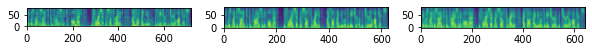

Real validation audio


SYNTHESIZED FOR -- Speaker: 6081 | Text: Be guided by me; confess everything, while there is yet time; and abandon the present course which may lead you into serious danger.
Lookup Audio


Titanet Audio


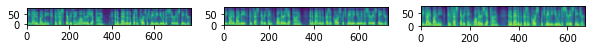

Real validation audio


SYNTHESIZED FOR -- Speaker: 8609 | Text: "I was mentioning your case to him," observed mr Yorke.
Lookup Audio


Titanet Audio


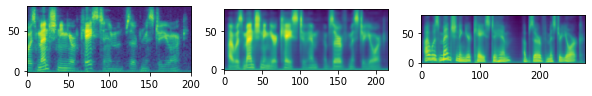

Real validation audio


SYNTHESIZED FOR -- Speaker: 8465 | Text: She did not know, perhaps never would understand the ghastly horror of conscious guilt, besides which there is no evil else.
Lookup Audio


Titanet Audio


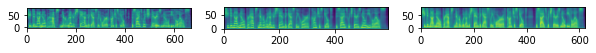

Real validation audio


SYNTHESIZED FOR -- Speaker: 3486 | Text: She tightened her grasp upon dreaming ruth; motioned us to go within. We passed, silently; behind us she came, followed by three of the great globes, by a pair of her tetrahedrons.
Lookup Audio


Titanet Audio


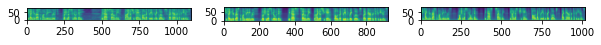

Real validation audio


SYNTHESIZED FOR -- Speaker: 200 | Text: "You have no cause for alarm, ladies," said the officer, pausing a moment, and contemplating the pale faces around him.
Lookup Audio


Titanet Audio


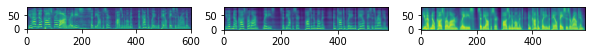

Real validation audio


SYNTHESIZED FOR -- Speaker: 3242 | Text: But next day she came again and paid down four bits, and Clytie reckoned that that ought to fetch Bud sure.
Lookup Audio


Titanet Audio


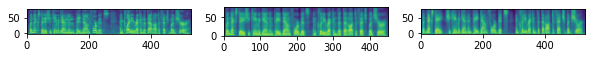

Real validation audio


SYNTHESIZED FOR -- Speaker: 5678 | Text: "Well, my dear?" she asked.
Lookup Audio


Titanet Audio


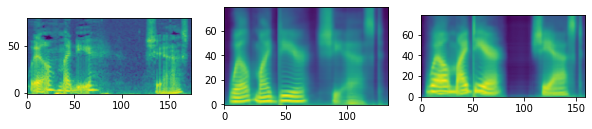

In [85]:
# Only need to set speaker_id if there is more than one speaker
speaker_id = None
plt.rcParams['figure.figsize'] = [10, 5]
            
for val_record in val_records:
    print("Real validation audio")
    ipd.display(ipd.Audio(val_record['audio_filepath'], rate=22050))
    #get GT mel spect
    original_spec = get_mel_spect(file_path=val_record['audio_filepath'])
    
    speaker_id = val_record['speaker_id']
    speaker_emb = np.expand_dims(libritts_speaker_embeddings[str(val_record['speaker_id'])], axis=0)
    
    print(f"SYNTHESIZED FOR -- Speaker: {speaker_id} | Text: {val_record['normalized_text']}")
    spec_1, audio_1 = infer(spec_gen_emb_lookup_libritts, vocoder, val_record['normalized_text'], speaker=speaker_id)
    spec_2, audio_2 = infer(spec_gen_titanet, vocoder, val_record['normalized_text'], speaker_emb=speaker_emb)
    print("Lookup Audio")
    ipd.display(ipd.Audio(audio_1, rate=22050))
    print("Titanet Audio")
    ipd.display(ipd.Audio(audio_2, rate=22050))
    f, axarr = plt.subplots(1,3)
    axarr[0].imshow(original_spec, origin="lower")
    axarr[1].imshow(spec_1, origin="lower")
    axarr[2].imshow(spec_2, origin="lower")
#     imshow(spec, origin="lower", aspect="auto")
    plt.show()

### Visualize Embeddings

In [87]:
spec_gen_emb_lookup.fastpitch.speaker_emb

Embedding(12800, 384)

In [89]:
hifitts_spk = set()
for h in hifitts:
    hifitts_spk.add(h['speaker'])
hifitts_spk

{92, 6097, 6670, 6671, 8051, 9017, 9136, 11614, 11697, 12787}

In [129]:
spec_gen_emb_lookup.cpu()
lookup_emb = torch.vstack( [spec_gen_emb_lookup.fastpitch.speaker_emb(torch.tensor([spk]).to('cpu')).detach() for spk in hifitts_spk] )

In [109]:
titanet_emb = torch.vstack( [torch.Tensor(hifitts_speaker_embeddings[spk]) for spk in hifitts_spk] )

In [112]:
torch.pca_lowrank(titanet_emb)

(tensor([[-0.0103,  0.0438,  0.0989,  0.0886,  0.2099, -0.7252],
         [-0.0781,  0.0603,  0.0351,  0.1509,  0.2466, -0.0248],
         [-0.0270,  0.1044,  0.1122,  0.2025,  0.3071,  0.6791],
         [-0.1807, -0.2644,  0.6800, -0.5222, -0.2349,  0.0609],
         [-0.0514,  0.0499,  0.0260,  0.5608, -0.7612,  0.0046],
         [-0.0537,  0.0028,  0.0886,  0.1618,  0.2407, -0.0468],
         [-0.2935, -0.6562, -0.5971, -0.1419, -0.0150,  0.0439],
         [ 0.9125, -0.1091, -0.1172, -0.1822, -0.0761,  0.0366],
         [-0.0300,  0.0899,  0.0391,  0.1657,  0.2638, -0.0515],
         [-0.1878,  0.6786, -0.3655, -0.4840, -0.1809,  0.0232]]),
 tensor([0.1836, 0.1577, 0.1328, 0.1049, 0.0978, 0.0594]),
 tensor([[ 0.0361,  0.0444, -0.0426, -0.0193, -0.0757, -0.0809],
         [ 0.0654, -0.0694,  0.0280,  0.0853,  0.1301, -0.0360],
         [-0.1003,  0.1098,  0.0124, -0.0498, -0.0815, -0.0886],
         ...,
         [-0.0229,  0.0520, -0.0379,  0.0719, -0.0324, -0.0325],
         [-0.01

In [113]:
from sklearn.decomposition import PCA

In [130]:
pca = PCA(n_components=2)
titanet_principalComponents = pca.fit_transform(titanet_emb)
lookup_principalComponents = pca.fit_transform(lookup_emb)

In [131]:
titanet_principalComponents.shape, lookup_principalComponents.shape

((10, 2), (10, 2))

### Lookup table and Titanet embeddings of HiFiTTS dataset (10speakers) visualization

These speakers are unseen to FP model which uses Titanet embeddings, but seen to FP model which uses lookup table

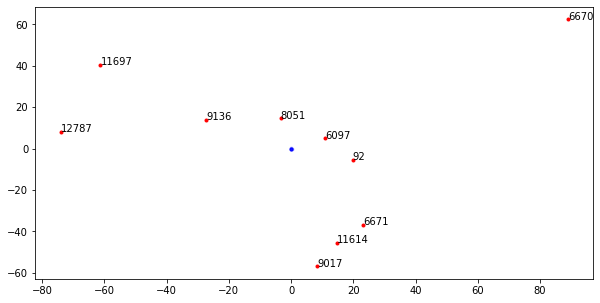

In [139]:
plt.scatter(lookup_principalComponents[:, 0], lookup_principalComponents[:, 1], c='red', marker='.')
for i, spk in enumerate(hifitts_spk):
    plt.annotate(str(spk), xy=(lookup_principalComponents[i,0], lookup_principalComponents[i,1]))
plt.scatter(titanet_principalComponents[:, 0], titanet_principalComponents[:, 1], c='blue', marker='.', alpha=0.2)

### Titanet embeddings of HiFiTTS dataset (10speakers) visualization

These speakers are unseen to FP model which uses Titanet embeddings, but seen to FP model which uses lookup table

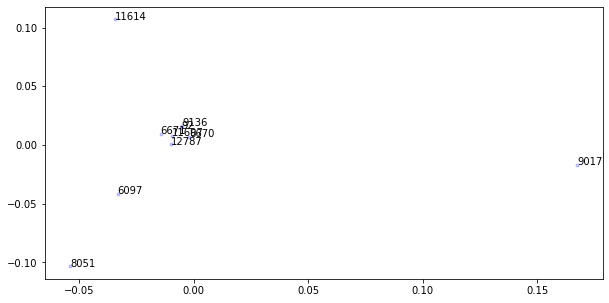

In [140]:
plt.scatter(titanet_principalComponents[:, 0], titanet_principalComponents[:, 1], c='blue', marker='.', alpha=0.2)
for i, spk in enumerate(hifitts_spk):
    plt.annotate(str(spk), xy=(titanet_principalComponents[i,0], titanet_principalComponents[i,1]))